<a href="https://colab.research.google.com/github/sanu1230/Academic-Project/blob/master/Stacking_Forest_lyst4482.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prediction of Forest cover type

## Load Dataset

In [ ]:
!pip -q install pandas_profiling==2.5.0

In [ ]:
!pip freeze | grep pandas

pandas==0.25.3
pandas-datareader==0.8.1
pandas-gbq==0.11.0
pandas-profiling==2.5.0
sklearn-pandas==1.8.0


In [ ]:
#Read dataset
!wget -q https://www.dropbox.com/s/lvetpn137577wi8/train_forest_covertype.csv

In [ ]:
#Install Packages

!pip -q install plotly-express
!pip -q install shap
!pip -q install eli5
!pip -q install lime
!pip -q install albumentations

## Import Packages

In [ ]:
#Import basic packages

import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import time
import seaborn as sns
import matplotlib.pyplot as plt
from subprocess import check_output
import pandas_profiling
import lightgbm as lgb
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, log_loss
%matplotlib inline


In [ ]:
!ls

sample_data  train_forest_covertype.csv  train_forest_covertype.csv.1


## Read data

### 1. Through Pandas

In [ ]:
# Read data through Pandas and compute time taken to read

t_start = time.time()
df_forest = pd.read_csv('train_forest_covertype.csv')
t_end = time.time()
print('pd.read_csv(): {} s'.format(t_end-t_start)) # time [s]
df_forest.head()

pd.read_csv(): 0.07005524635314941 s


,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


In [ ]:
df_forest['Cover_Type'].value_counts()

7    2160
6    2160
5    2160
4    2160
3    2160
2    2160
1    2160
Name: Cover_Type, dtype: int64

In [ ]:
df_forest.shape

(15120, 56)

### Through Dask

In [ ]:
# Read data through Dask and compute time taken to read

import dask.dataframe as dd

t_start = time.time()
df_dask = dd.read_csv('train_forest_covertype.csv')
t_end = time.time()
print('dd.read_csv(): {} s'.format(t_end-t_start)) # time [s]
df_dask.head()

dd.read_csv(): 0.03399181365966797 s


,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


### Subsample into n rows

In [ ]:
# Sample n rows
n = 2000
df_forest_sample = df_forest.sample(n)

In [ ]:
#Check whether data has been distributed equally among all crews
df_forest_sample['Cover_Type'].value_counts()

6    308
5    285
2    284
4    282
3    281
7    280
1    280
Name: Cover_Type, dtype: int64

In [ ]:
df_forest_sample.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
13857,13858,3286,95,13,408,120,1550,240,221,110,1535,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,7
7693,7694,2615,84,21,190,-2,1889,244,199,74,2060,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6
1563,1564,2751,83,23,42,-8,201,245,194,67,2249,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5
9746,9747,3419,156,19,484,260,1710,238,239,123,659,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,7
11729,11730,3277,72,3,595,86,5872,223,233,146,2836,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2


## Exploratory Data Analysis

### Let's look into summary statistics

In [ ]:
#Let's look into the total number of columns and observations in the dataset
df_forest_sample.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 13857 to 3419
Data columns (total 56 columns):
Id                                    2000 non-null int64
Elevation                             2000 non-null int64
Aspect                                2000 non-null int64
Slope                                 2000 non-null int64
Horizontal_Distance_To_Hydrology      2000 non-null int64
Vertical_Distance_To_Hydrology        2000 non-null int64
Horizontal_Distance_To_Roadways       2000 non-null int64
Hillshade_9am                         2000 non-null int64
Hillshade_Noon                        2000 non-null int64
Hillshade_3pm                         2000 non-null int64
Horizontal_Distance_To_Fire_Points    2000 non-null int64
Wilderness_Area1                      2000 non-null int64
Wilderness_Area2                      2000 non-null int64
Wilderness_Area3                      2000 non-null int64
Wilderness_Area4                      2000 non-null int64
Soil_Type1         

In [ ]:
#Let's look into summary statistics of data
df_forest_sample.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,2000.00000,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.00000,2000.0,2000.0,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.00000,2000.0,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.00000,2000.0,2000.00000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000
mean,7589.35150,2743.210500,159.990000,16.406000,223.83650,50.968500,1726.620000,211.994000,219.224000,136.384500,1488.010000,0.232000,0.030500,0.425000,0.312500,0.025500,0.042000,0.068000,0.054000,0.010500,0.04550,0.0,0.0,0.001000,0.14250,0.027000,0.011500,0.032500,0.00650,0.0,0.008500,0.042000,0.003000,0.004000,0.010000,0.000500,0.02250,0.053500,0.01650,0.0,0.00250,0.00250,0.000500,0.084500,0.046000,0.018500,0.043500,0.044500,0.00250,0.006000,0.001000,0.00150,0.048500,0.037000,0.034000,4.026000
std,4318.58755,417.506211,111.751528,8.397346,206.45813,59.675155,1318.160669,30.562772,22.630663,45.316845,1094.761327,0.422215,0.172002,0.494467,0.463628,0.157677,0.200639,0.251809,0.226074,0.101956,0.20845,0.0,0.0,0.031615,0.34965,0.162124,0.106646,0.177368,0.08038,0.0,0.091826,0.200639,0.054704,0.063135,0.099524,0.022361,0.14834,0.225085,0.12742,0.0,0.04995,0.04995,0.022361,0.278206,0.209537,0.134784,0.204031,0.206255,0.04995,0.077246,0.031615,0.03871,0.214874,0.188809,0.181274,1.997077
min,15.00000,1874.000000,0.000000,1.000000,0.00000,-134.000000,30.000000,78.000000,113.000000,0.000000,30.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.0,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,1.000000
25%,3856.50000,2373.000000,64.750000,10.000000,60.00000,4.000000,766.500000,195.000000,208.000000,107.000000,715.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.0,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,2.000000
50%,7583.00000,2744.000000,128.000000,15.000000,175.00000,35.000000,1338.000000,219.000000,223.000000,140.000000,1202.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.0,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,4.000000
75%,11293.00000,3082.000000,271.250000,22.000000,330.00000,78.000000,2347.250000,235.000000,235.000000,168.000000,1951

**Observations:**
There is not much data cleaning to perform.

### Data Cleaning

#### Pandas profiling

In [ ]:
#Perform Pandas profiling to understand quick overview of columns
import pandas_profiling 
report = pandas_profiling.ProfileReport(df_forest_sample)
#covert profile report as html file
report.to_file("flight_data.html")

In [ ]:
from IPython.display import display,HTML,IFrame

display(HTML(open('flight_data.html').read()))

Number of variables,57
Number of observations,2000
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,890.8 KiB
Average record size in memory,456.1 B
BOOL,44
NUM,13
Analysis started,2020-05-10 18:39:36.386719


#### Removal of unnecessary columns

**Observation:**
- From Pandas profiling we understand id is highly correlated with index and thus can be removed. We will also remove Soil_Type 7 and Soil_Type_15  columns when performing model building.

In [ ]:
df_forest.shape

(15120, 56)

In [ ]:
df_forest_sample.shape

(2000, 56)

In [ ]:
df_forest_sample.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
13857,13858,3286,95,13,408,120,1550,240,221,110,1535,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,7
7693,7694,2615,84,21,190,-2,1889,244,199,74,2060,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6
1563,1564,2751,83,23,42,-8,201,245,194,67,2249,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5
9746,9747,3419,156,19,484,260,1710,238,239,123,659,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,7
11729,11730,3277,72,3,595,86,5872,223,233,146,2836,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2


In [ ]:
df_forest_sample.drop(['Soil_Type7','Soil_Type15'],inplace=True,axis=1)

In [ ]:
# count the number of NaN values in each column
print(df_forest_sample.isnull().sum())


Id                                    0
Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0
Soil_Type11                           0


In [ ]:
''' There is no null values, however as per pandas profile, 
Horizontal_Distance_To_Hydrology  &  Vertical_Distance_To_Hydrology has zeros as value       
'''

' There is no null values, however as per pandas profile, \nHorizontal_Distance_To_Hydrology  &  Vertical_Distance_To_Hydrology has zeros as value       \n'

In [ ]:
#The datatypes have now been changed
df_forest_sample.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 13857 to 3419
Data columns (total 54 columns):
Id                                    2000 non-null int64
Elevation                             2000 non-null int64
Aspect                                2000 non-null int64
Slope                                 2000 non-null int64
Horizontal_Distance_To_Hydrology      2000 non-null int64
Vertical_Distance_To_Hydrology        2000 non-null int64
Horizontal_Distance_To_Roadways       2000 non-null int64
Hillshade_9am                         2000 non-null int64
Hillshade_Noon                        2000 non-null int64
Hillshade_3pm                         2000 non-null int64
Horizontal_Distance_To_Fire_Points    2000 non-null int64
Wilderness_Area1                      2000 non-null int64
Wilderness_Area2                      2000 non-null int64
Wilderness_Area3                      2000 non-null int64
Wilderness_Area4                      2000 non-null int64
Soil_Type1         

### Data Visualization

#### Let's check the number of unique cover type

In [ ]:
df_forest_sample.Cover_Type.unique()

array([7, 6, 5, 2, 3, 4, 1])

In [ ]:
df_forest_sample.Cover_Type.value_counts()

6    308
5    285
2    284
4    282
3    281
7    280
1    280
Name: Cover_Type, dtype: int64

**Observation**:
There are 7 unique cover types and the dataset is balanced.





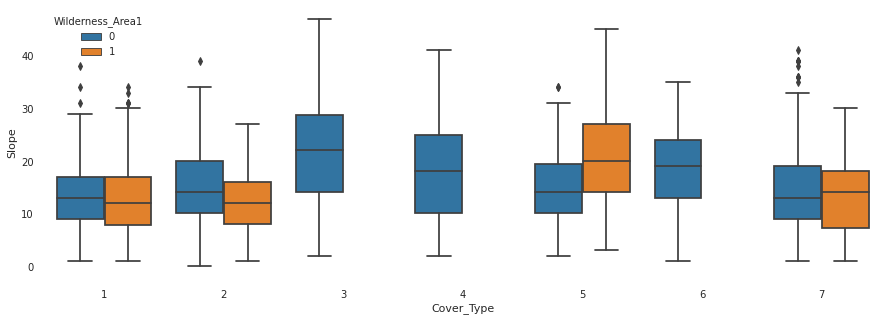

In [ ]:
plt.figure(figsize=(15,5))
sns.boxplot(x="Cover_Type", y="Slope", hue='Wilderness_Area1', data = df_forest_sample, )

In [ ]:
import plotly.express as px

fig = px.box(data_frame=df_forest_sample, x="Cover_Type", y="Slope", color='Wilderness_Area1', 
             hover_data=['Elevation', 'Aspect', 'Slope'],
             title='Forest Cover Type based on slope')
fig.show()

## Model Building

### Prepare the data

In [ ]:
# Importing Models
from sklearn import svm, tree, linear_model, neighbors, naive_bayes, ensemble, discriminant_analysis, gaussian_process
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# Importing other tools
from sklearn import model_selection
from sklearn.metrics import confusion_matrix, classification_report, make_scorer
from sklearn.metrics import accuracy_score, recall_score, precision_recall_curve
from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.calibration import CalibratedClassifierCV

In [ ]:
# Defining random seed
seed=42

# Creating Models

lr = LogisticRegression()
lda = LinearDiscriminantAnalysis()
svc = SVC(random_state=seed, probability=True)
dtree = DecisionTreeClassifier(random_state=seed)
rf = RandomForestClassifier(10, random_state=seed)
gdb = GradientBoostingClassifier(random_state=seed)
adb = AdaBoostClassifier(random_state=seed)
xgb = XGBClassifier(random_state=seed)
knn = KNeighborsClassifier()
lgbm = LGBMClassifier(random_state=seed)

first_models = [ lr, lda, svc, dtree, 
                 rf, gdb, adb, xgb, knn, lgbm]
first_model_names = ['Logistic Regression','LDA','SVM','Decision Tree', 
                     'Random Forest', 'GradientBoosting',
                    'AdaBoost', 'XGB', 'K-Neighbors','Light GBM'] 

# Defining other steps
n_folds = 5
skf = model_selection.ShuffleSplit(n_splits = n_folds, test_size = .3, train_size = .7, random_state = seed ) 
std_sca = StandardScaler()

In [ ]:
#Standardize rows into uniform scale

X = df_forest_sample.drop(['Cover_Type'],axis=1)
y = df_forest_sample['Cover_Type']

### Initial Model building

In [ ]:
MLA_columns = ['MLA Name', 'MLA Parameters', 'MLA Train Accuracy Mean', 'MLA Test Accuracy Mean', 'MLA Time']
MLA_compare = pd.DataFrame(columns = MLA_columns)

#create table to compare MLA predictions
MLA_predict = df_forest_sample[['Id']]

train_size = X.shape[0]
n_models = len(first_models)
oof_pred = np.zeros((train_size, n_models))
scores = []
row_index=0

for n, model in enumerate(first_models):
    model_pipeline = Pipeline(steps=[('Scaler', std_sca),
                                     ('Estimator', model)])
    MLA_name = model.__class__.__name__
    MLA_compare.loc[row_index, 'MLA Name'] = MLA_name
    MLA_compare.loc[row_index, 'MLA Parameters'] = str(model.get_params())
    
    cv_results = model_selection.cross_validate(model, X, y, cv  = skf, return_train_score=True)

    MLA_compare.loc[row_index, 'MLA Time'] = cv_results['fit_time'].mean()
    MLA_compare.loc[row_index, 'MLA Train Accuracy Mean'] = cv_results['train_score'].mean()
    MLA_compare.loc[row_index, 'MLA Test Accuracy Mean'] = cv_results['test_score'].mean()  
    
    model_pipeline.fit(X, y)
    MLA_predict[MLA_name] = model_pipeline.predict(X)
    row_index+=1
        

In [ ]:
#print and sort table: https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.sort_values.html
MLA_compare.sort_values(by = ['MLA Test Accuracy Mean'], ascending = False, inplace = True)
MLA_compare

,MLA Name,MLA Parameters,MLA Train Accuracy Mean,MLA Test Accuracy Mean,MLA Time
9,LGBMClassifier,"{'boosting_type': 'gbdt', 'class_weight': None...",1,0.752667,0.979529
5,GradientBoostingClassifier,"{'ccp_alpha': 0.0, 'criterion': 'friedman_mse'...",0.979143,0.748333,3.4835
7,XGBClassifier,"{'base_score': 0.5, 'booster': 'gbtree', 'cols...",0.895286,0.734333,1.57014
4,RandomForestClassifier,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",0.992,0.724667,0.0362893
3,DecisionTreeClassifier,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",1,0.672,0.0176455
1,LinearDiscriminantAnalysis,"{'n_components': None, 'priors': None, 'shrink...",0.673286,0.644667,0.0308984
8,KNeighborsClassifier,"{'algorithm': 'auto', 'leaf_size': 30, 'metric...",0.757429,0.621,0.00879335
6,AdaBoostClassifier,"{'algorithm': 'SAMME.R', 'base_estimator': Non...",0.435571,0.428667,0.193622
2,SVC,"{'C': 1.0, 'break_ties': False, 'cache_size': ...",0.401714,0.383,1.25845
0,LogisticRegression,"{'C': 1.0, 'class_weight': None, 'dual': False...",0.372286,0.35,0.224603


In [ ]:
MLA_predict.head(10)

,Id,LogisticRegression,LinearDiscriminantAnalysis,SVC,DecisionTreeClassifier,RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier,XGBClassifier,KNeighborsClassifier,LGBMClassifier
13857,13858,7,7,7,7,7,7,1,7,7,7
7693,7694,6,5,5,6,6,6,6,6,6,6
1563,1564,5,5,5,5,5,5,5,5,5,5
9746,9747,7,7,7,7,7,7,7,7,7,7
11729,11730,1,1,2,2,2,2,1,1,2,2
8401,8402,2,5,5,5,5,5,5,5,5,5
5638,5639,3,3,6,6,6,6,3,6,6,6
1668,1669,1,1,2,2,2,2,5,1,2,2
2565,2566,5,2,5,5,5,5,5,5,1,5
11109,11110,3,3,3,3,3,3,6,3,3,3


### Understand feature importance

In [ ]:
feature_names = X.columns
feat_imp_df = pd.DataFrame(columns=first_model_names, index=feature_names)

# Dropping the Models that don't have feature importances for this analysis
feat_imp_df.drop(['SVM','K-Neighbors'], axis=1, inplace=True)


# I'm using absolute values for logistic Regression and LDA because we only care about the magnitude of the coefficient, not its direction 
#feat_imp_df['Logistic Regression'] = np.abs(lr.coef_.ravel())
#feat_imp_df['LDA'] = np.abs(lda.coef_.flatten())
feat_imp_df['Decision Tree'] = dtree.feature_importances_
feat_imp_df['Random Forest'] = rf.feature_importances_
feat_imp_df['GradientBoosting'] = gdb.feature_importances_
feat_imp_df['AdaBoost'] = adb.feature_importances_
feat_imp_df['XGB'] = xgb.feature_importances_
feat_imp_df['Light GBM'] = lgbm.feature_importances_
feat_imp_df.head()

,Logistic Regression,LDA,Decision Tree,Random Forest,GradientBoosting,AdaBoost,XGB,Light GBM
Id,NaN,NaN,0.048285,0.060865,0.058011,0.0,0.017616,2100
Elevation,NaN,NaN,0.442610,0.213001,0.541117,0.3,0.089643,3585
Aspect,NaN,NaN,0.025769,0.053914,0.014940,0.0,0.010877,1214
Slope,NaN,NaN,0.020743,0.034764,0.008553,0.0,0.007823,886
Horizontal_Distance_To_Hydrology,NaN,NaN,0.047181,0.066377,0.045710,0.0,0.019173,1813


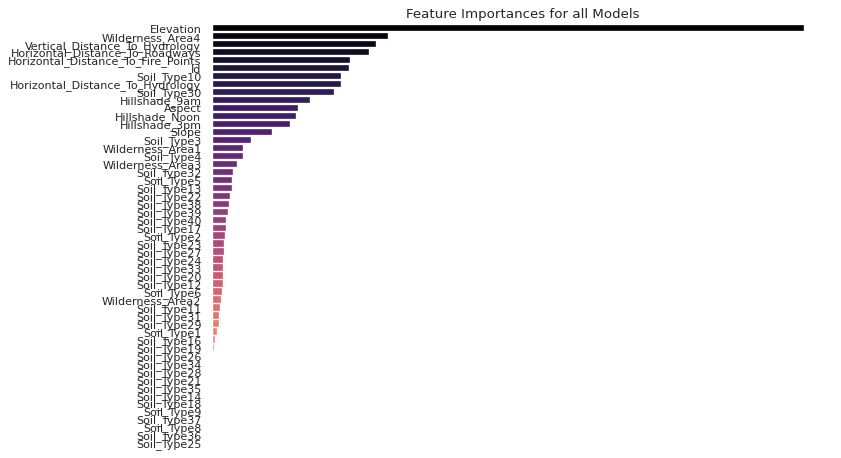

In [ ]:
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

scaled_fi = pd.DataFrame(data=mms.fit_transform(feat_imp_df),
                         columns=feat_imp_df.columns,
                         index=feat_imp_df.index)
scaled_fi['Overall'] = scaled_fi.sum(axis=1)

ordered_ranking = scaled_fi.sort_values('Overall', ascending=False)
fig, ax = plt.subplots(figsize=(10,7), dpi=80)
sns.barplot(data=ordered_ranking, y=ordered_ranking.index, x='Overall', palette='magma')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.xaxis.set_visible(False)
ax.grid(False)
ax.set_title('Feature Importances for all Models');

In [ ]:
ordered_ranking.index[:-20:-1]

Index(['Soil_Type25', 'Soil_Type36', 'Soil_Type8', 'Soil_Type37', 'Soil_Type9',
       'Soil_Type18', 'Soil_Type14', 'Soil_Type35', 'Soil_Type21',
       'Soil_Type28', 'Soil_Type34', 'Soil_Type26', 'Soil_Type19',
       'Soil_Type16', 'Soil_Type1', 'Soil_Type29', 'Soil_Type31',
       'Soil_Type11', 'Wilderness_Area2'],
      dtype='object')

In [ ]:
train_v2 = df_forest_sample.drop(ordered_ranking.index[:-20:-1], axis=1)

X_v1 = train_v2.drop(['Cover_Type'],axis=1)
y_v1 = train_v2['Cover_Type']



### Model Building after removing irrelevant features

In [ ]:
MLA_columns = ['MLA Name', 'MLA Parameters','MLA Train Accuracy Mean', 'MLA Test Accuracy Mean', 'MLA Time']
MLA_compare = pd.DataFrame(columns = MLA_columns)

#create table to compare MLA predictions
MLA_predict = train_v2[['Id']]

train_size = X_v1.shape[0]
n_models = len(first_models)
oof_pred = np.zeros((train_size, n_models))
scores = []
row_index=0

for n, model in enumerate(first_models):
    model_pipeline = Pipeline(steps=[('Scaler', std_sca),
                                     ('Estimator', model)])
    MLA_name = model.__class__.__name__
    MLA_compare.loc[row_index, 'MLA Name'] = MLA_name
    MLA_compare.loc[row_index, 'MLA Parameters'] = str(model.get_params())
    
    #score model with cross validation: http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_validate.html#sklearn.model_selection.cross_validate
    cv_results = model_selection.cross_validate(model, X_v1, y_v1, cv  = skf, return_train_score=True)

    MLA_compare.loc[row_index, 'MLA Time'] = cv_results['fit_time'].mean()
    MLA_compare.loc[row_index, 'MLA Train Accuracy Mean'] = cv_results['train_score'].mean()
    MLA_compare.loc[row_index, 'MLA Test Accuracy Mean'] = cv_results['test_score'].mean()  
    
    model_pipeline.fit(X_v1, y_v1)
    MLA_predict[MLA_name] = model_pipeline.predict(X_v1)
    
    #model_pipeline.fit(X, y)
    #val_pred = model_pipeline.predict(x_val)
    #oof_pred[X, n] = model_pipeline.predict_proba(X)[:,1]
    row_index+=1
        

In [ ]:
#print and sort table: https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.sort_values.html
MLA_compare.sort_values(by = ['MLA Test Accuracy Mean'], ascending = False, inplace = True)
MLA_compare

,MLA Name,MLA Parameters,MLA Train Accuracy Mean,MLA Test Accuracy Mean,MLA Time
9,LGBMClassifier,"{'boosting_type': 'gbdt', 'class_weight': None...",1,0.758667,0.960805
5,GradientBoostingClassifier,"{'ccp_alpha': 0.0, 'criterion': 'friedman_mse'...",0.978571,0.746,3.32261
7,XGBClassifier,"{'base_score': 0.5, 'booster': 'gbtree', 'cols...",0.895429,0.735,1.05724
4,RandomForestClassifier,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",0.992286,0.727667,0.0336568
3,DecisionTreeClassifier,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",1,0.68,0.0168634
1,LinearDiscriminantAnalysis,"{'n_components': None, 'priors': None, 'shrink...",0.662286,0.649,0.0180197
8,KNeighborsClassifier,"{'algorithm': 'auto', 'leaf_size': 30, 'metric...",0.757429,0.621,0.00610361
6,AdaBoostClassifier,"{'algorithm': 'SAMME.R', 'base_estimator': Non...",0.435571,0.428667,0.176419
2,SVC,"{'C': 1.0, 'break_ties': False, 'cache_size': ...",0.402857,0.383,0.952043
0,LogisticRegression,"{'C': 1.0, 'class_weight': None, 'dual': False...",0.367143,0.344667,0.21318


In [ ]:
#Models with lest difference between train and test
#Model accuracy should be more that 80%
#Models that take less time

### GridSearchCV

In [ ]:
first_models = [rf,lgbm,knn]
first_model_names = ['rf','lgbm', 'knn'] 

In [ ]:
LGBM_param_grid = {'lgbm__learning_rate': [0.1],
    'lgbm__n_estimators': [100],
    'lgbm__num_leaves': [31], # large num_leaves helps improve accuracy but might lead to over-fitting
    'lgbm__boosting_type' : ['gbdt', 'dart'], # for better accuracy -> try dart
    
                  }

RF_param_grid = {
                
               'rf__n_estimators': [100,200], #default=10
            'rf__criterion': ['gini', 'entropy'], #default=”gini”
            'rf__max_depth': [2,4,8] ,#default=None
            'rf__oob_score': ['True']
}

GDB_param_grid = {
    "gdb__loss":["deviance"],
    "gdb__learning_rate": [0.01,0.1],
    
    "gdb__max_depth":[3,5],
   
    "gdb__criterion": ["friedman_mse",  "mae"],
    
    "gdb__n_estimators":[10]
    
}
XGB_param_grid = {
    'xgb__min_child_weight': [1, 5],
        'xgb__gamma': [0.5, 1],
        'xgb__max_depth': [3, 4, 5]
}

KNN_param_grid = {
    'knn__n_neighbors':[5,6,7],
          'knn__leaf_size':[1,2,3,5],
          
}

In [ ]:
from sklearn.model_selection import GridSearchCV
columns = ['Name', 'Parameters', 'Train Accuracy Mean', 'Test Accuracy']
#models = [LGBMClassifier(),RandomForestClassifier()]
params_grid = [RF_param_grid,LGBM_param_grid,KNN_param_grid]

after_model_compare = pd.DataFrame(columns = columns)

row_index = 0
for n,alg in enumerate(first_models):
    print(alg)
    model_pipeline = Pipeline(steps=[('Scaler', std_sca),
                                     (first_model_names[n], first_models[n])])
    
    gs_alg = GridSearchCV(model_pipeline, param_grid = params_grid[0], cv = skf, scoring = 'accuracy', n_jobs=-1,return_train_score=True)
    params_grid.pop(0)

    #set name and parameters
    model_name = alg.__class__.__name__
    after_model_compare.loc[row_index, 'Name'] = model_name
    
    gs_alg.fit(X_v1, y_v1)
   
    after_model_compare.loc[row_index, 'Parameters'] = str(gs_alg.best_params_)
 
    
    after_model_compare.loc[row_index, 'Train Accuracy Mean'] = gs_alg.cv_results_['mean_train_score'][gs_alg.best_index_]
    after_model_compare.loc[row_index, 'Test Accuracy'] = gs_alg.cv_results_['mean_test_score'][gs_alg.best_index_]
    
    row_index+=1
    print(row_index, alg.__class__.__name__, 'trained...')

after_model_compare

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)
1 RandomForestClassifier trained...
LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=42, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsamp

,Name,Parameters,Train Accuracy Mean,Test Accuracy
0,RandomForestClassifier,"{'rf__criterion': 'entropy', 'rf__max_depth': ...",0.926143,0.747333
1,LGBMClassifier,"{'lgbm__boosting_type': 'gbdt', 'lgbm__learnin...",1,0.754667
2,KNeighborsClassifier,"{'knn__leaf_size': 1, 'knn__n_neighbors': 5}",0.752429,0.638333


### Stacking

#### Through voting classifier

In [ ]:
vote_est = [
    #Ensemble Methods: http://scikit-learn.org/stable/modules/ensemble.html
    
    ('rfc', ensemble.RandomForestClassifier()),
    
    #Nearest Neighbor: http://scikit-learn.org/stable/modules/neighbors.html
    ('knn', neighbors.KNeighborsClassifier()),
    
    #xgboost: http://xgboost.readthedocs.io/en/latest/model.html
   ('xgb', XGBClassifier()),
   ('lgbm',LGBMClassifier())

]


#Hard Vote or majority rules
vote_hard = ensemble.VotingClassifier(estimators = vote_est , voting = 'hard')
vote_hard_cv = model_selection.cross_validate(vote_hard, X, y, cv  = skf)
vote_hard.fit(X, y)
#print("Hard Voting Training w/bin score mean: {:.2f}". format(vote_hard_cv['train_score'].mean()*100)) 
print("Hard Voting Test w/bin score mean: {:.2f}". format(vote_hard_cv['test_score'].mean()*100))
print("Hard Voting Test w/bin score 3*std: +/- {:.2f}". format(vote_hard_cv['test_score'].std()*100*3))
print('-'*10)


#Soft Vote or weighted probabilities
vote_soft = ensemble.VotingClassifier(estimators = vote_est , voting = 'soft')
vote_soft_cv = model_selection.cross_validate(vote_soft, X, y, cv  = skf)
vote_soft.fit(X, y)

#print("Soft Voting Training w/bin score mean: {:.2f}". format(vote_soft_cv['train_score'].mean()*100)) 
print("Soft Voting Test w/bin score mean: {:.2f}". format(vote_soft_cv['test_score'].mean()*100))
print("Soft Voting Test w/bin score 3*std: +/- {:.2f}". format(vote_soft_cv['test_score'].std()*100*3))
print('-'*10)

Hard Voting Test w/bin score mean: 76.87
Hard Voting Test w/bin score 3*std: +/- 4.04
----------
Soft Voting Test w/bin score mean: 77.77
Soft Voting Test w/bin score 3*std: +/- 2.23
----------


#### Through mlxtend

In [ ]:
from mlxtend.classifier import StackingClassifier

In [ ]:
lgbm_cl = LGBMClassifier(random_state=seed)
lgbm_cl.set_params = after_model_compare['Parameters'][1]

In [ ]:
rf_cl = RandomForestClassifier(10, random_state=seed)

In [ ]:
gdb_cl = GradientBoostingClassifier(random_state=seed)

In [ ]:
logreg = LogisticRegression()

In [ ]:
sclf = StackingClassifier(classifiers=[lgbm_cl, rf_cl,gdb_cl],
                          meta_classifier=logreg)

label = ['LGBM', 'Random Forest','GDB' 'Stacking Classifier']
clf_list = [lgbm_cl, rf_cl,gdb_cl, logreg]

In [ ]:
for clf, label in zip([lgbm_cl, rf_cl,gdb_cl,sclf], 
                      ['LGBM', 
                       'Random Forest', 
                       'GDB',
                       'StackingClassifier']):

    scores = model_selection.cross_val_score(clf, X_v1, y_v1, 
                                              cv=3, scoring='accuracy')
    print("Accuracy: %0.2f (+/- %0.2f) [%s]" 
          % (scores.mean(), scores.std(), label))

Accuracy: 0.75 (+/- 0.01) [LGBM]
Accuracy: 0.71 (+/- 0.01) [Random Forest]
Accuracy: 0.73 (+/- 0.01) [GDB]
Accuracy: 0.67 (+/- 0.01) [StackingClassifier]


In [ ]:
!pip install vecstack

  Created wheel for vecstack: filename=vecstack-0.4.0-cp36-none-any.whl size=19877 sha256=534a4dcadecb49f69b02d91f504007cfaf8a3f50a4316ed7140e8ca2c25ab2de
  Stored in directory: /root/.cache/pip/wheels/5f/bb/4e/f6488433d53bc0684673d6845e5bf11a25240577c8151c140e
Successfully built vecstack


#### Through vecstack

In [ ]:
from vecstack import stacking

In [ ]:
#1st level model
X_train, X_test, y_train, y_test = train_test_split(X_v1, y_v1, test_size=0.2)

models = [lgbm_cl,rf_cl,gdb_cl]
S_train, S_test = stacking(models, X_train, y_train, X_test, 
    regression = False, metric = accuracy_score, n_folds = 4 , 
    shuffle = True, random_state = 0, verbose = 2)

task:         [classification]
n_classes:    [7]
metric:       [accuracy_score]
mode:         [oof_pred_bag]
n_models:     [3]

model  0:     [LGBMClassifier]
    fold  0:  [0.72250000]
    fold  1:  [0.73750000]
    fold  2:  [0.73750000]
    fold  3:  [0.76750000]
    ----
    MEAN:     [0.74125000] + [0.01634587]
    FULL:     [0.74125000]

model  1:     [RandomForestClassifier]
    fold  0:  [0.68250000]
    fold  1:  [0.72500000]
    fold  2:  [0.70000000]
    fold  3:  [0.73250000]
    ----
    MEAN:     [0.71000000] + [0.01992172]
    FULL:     [0.71000000]

model  2:     [GradientBoostingClassifier]
    fold  0:  [0.74000000]
    fold  1:  [0.73250000]
    fold  2:  [0.73750000]
    fold  3:  [0.77750000]
    ----
    MEAN:     [0.74687500] + [0.01788636]
    FULL:     [0.74687500]



In [ ]:
#2nd level model
models = [xgb]
S_train, S_test = stacking(models, S_train, y_train, S_test, 
    regression = False, metric = accuracy_score, n_folds = 4 , 
    shuffle = True, random_state = 0, verbose = 2)

task:         [classification]
n_classes:    [7]
metric:       [accuracy_score]
mode:         [oof_pred_bag]
n_models:     [1]

model  0:     [XGBClassifier]
    fold  0:  [0.72500000]
    fold  1:  [0.75000000]
    fold  2:  [0.74500000]
    fold  3:  [0.78500000]
    ----
    MEAN:     [0.75125000] + [0.02161452]
    FULL:     [0.75125000]

